<a href="https://colab.research.google.com/github/Cherrymmu/AIFFEL_Online_Quest_Cherry/blob/main/Exploration_CR7/Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 2. 거울아 거울아, 나는 멍멍이 상이니, 아니면 냥이 상이니? [프로젝트]
---
2-1. 프로젝트: 새로운 데이터셋으로 나만의 이미지 분류기 만들어보기
자, 이제 여러분의 차례입니다.
지금까지 진행했던 모든 과정을 통째로 활용해서, 새로운 데이터셋에 대해 여러분의 직접 모델을 만들어 볼 것입니다.

다음에 제안된 순서는 모두 위에서 진행했던 과정의 일부입니다. 몇 가지 코드만 수정하면 성공적으로 프로젝트를 진행할 수 있을 것입니다.
진행하다가 혹시 도움이 필요하다면 위에서 진행했던 실습 코드를 다시 참고하세요! 모든 해답은 그 안에 있습니다.

그러면, 시작해볼까요!

Step 1. 데이터셋 내려받기
이번에는 tensorflow_datasets 에 포함된 tf_flowers 데이터를 사용해 보겠습니다. tf_flowers 데이터에 대한 정보는 다음에서 확인해볼 수 있습니다.
tfds.load를 활용하여 데이터셋을 다운받으세요.
https://www.tensorflow.org/datasets/catalog/tf_flowers

In [103]:
import warnings
warnings.filterwarnings("ignore")

print("완료!")

완료!


In [104]:
# tensorflow, tensorflow_datasets_download
import tensorflow as tf
import tensorflow_datasets as tfds

print(tf.__version__)
print(tfds.__version__)

2.15.0
4.9.4


In [105]:
# 데이터셋 다운로드 & 압축 해제
dataset_url = "http://download.tensorflow.org/example_images/flower_photos.tgz"
data_dir = tf.keras.utils.get_file(origin=dataset_url,
                                   fname='tf_flowers',
                                   untar=True)

In [106]:
# 데이터 다운받은 것을 활용해서 train, validation, test 셋으로 나누는 작업
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir=data_dir,
    download=True,
    with_info=True,
    as_supervised=True,
)

In [107]:
# 데이터셋 확인
print(raw_train)
print(raw_validation)
print(raw_test)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


In [108]:
# 클래스의 수를 확인
num_classes = metadata.features['label'].num_classes
print("꽃의 종류 수:", num_classes)

꽃의 종류 수: 5


이미지의 크기가 전부 다르기 때문에 크기를 맞춰주는 작업을 해야겠다.

In [109]:
# 일단 그 전에 시각화로 데이터 확인
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print("힣")

힣


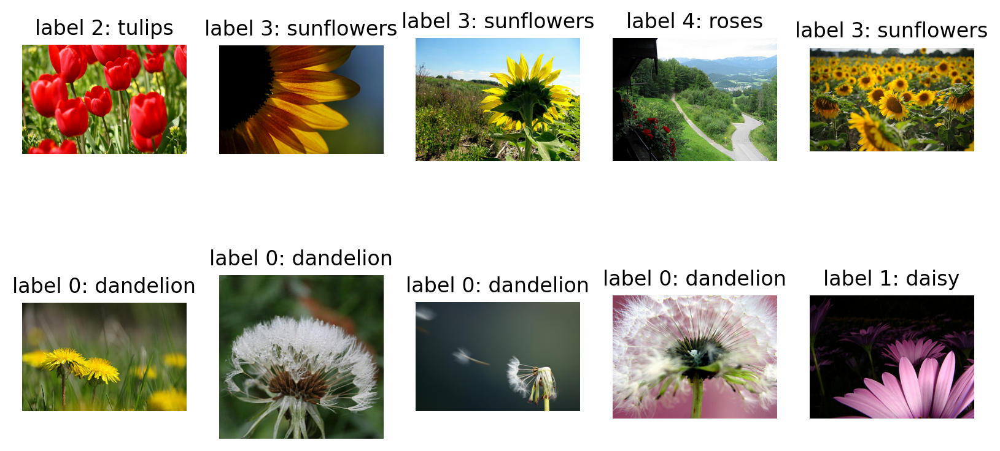

In [110]:
# 10, 5 짜리 그래프로 확인
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)): # 10개의 데이터 가져옴
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [111]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

# 데이터 증강 설정
data_gen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

get_label_name = metadata.features['label'].int2str
plt.figure(figsize=(50, 50))  # 변경된 부분: 그래프 크기를 두 배로 조정

<Figure size 5000x5000 with 0 Axes>

<Figure size 5000x5000 with 0 Axes>

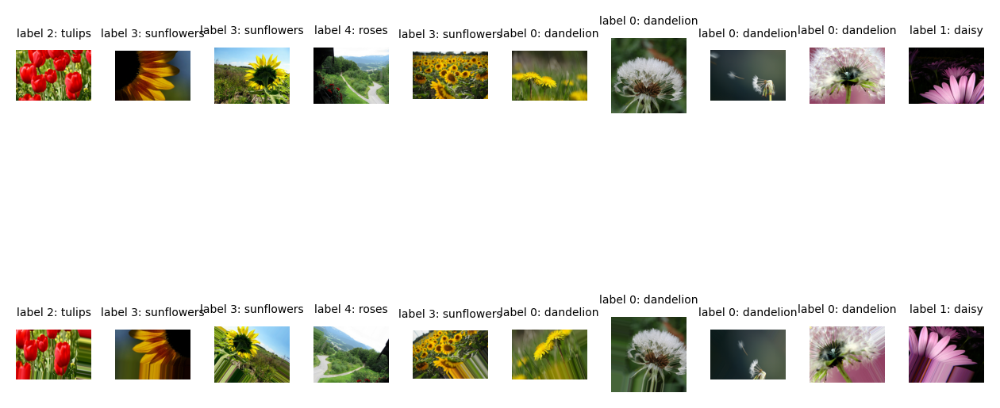

In [112]:
# 원본 이미지 및 증강 이미지 시각화
for idx, (image, label) in enumerate(raw_train.take(10)):
    # 원본 이미지
    plt.subplot(2, 10, idx+1)  # 2행 10열의 첫 번째 행에 원본 이미지 배치
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}', fontsize=5)  # 제목의 글꼴 크기 조정
    plt.axis('off')

    # 데이터 증강 적용
    augmented_image = data_gen.random_transform(image.numpy())
    plt.subplot(2, 10, idx+11)  # 2행 10열의 두 번째 행에 증강 이미지 배치
    plt.imshow(augmented_image.astype('uint8'))  # 캐스팅 필요
    plt.title(f'label {label}: {get_label_name(label)}', fontsize=5)  # 제목의 글꼴 크기 조정
    plt.axis('off')

plt.tight_layout()  # 그래프의 레이아웃을 자동으로 조정
plt.show()

In [113]:
# 데이터의 크기 조절을 하겠다.
IMG_SIZE = 160 #리사이징 이미지 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32) # image=float(image)같은 타입캐스팅의 텐서플로우 버전
    image = (image/255.0) # 픽셀 값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

print("힣")

힣


In [114]:
# IMG_SIZE를 160으로 지정해 줌으로써, 모든 이미지의 크기를 (160, 160, 3)으로 통일
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


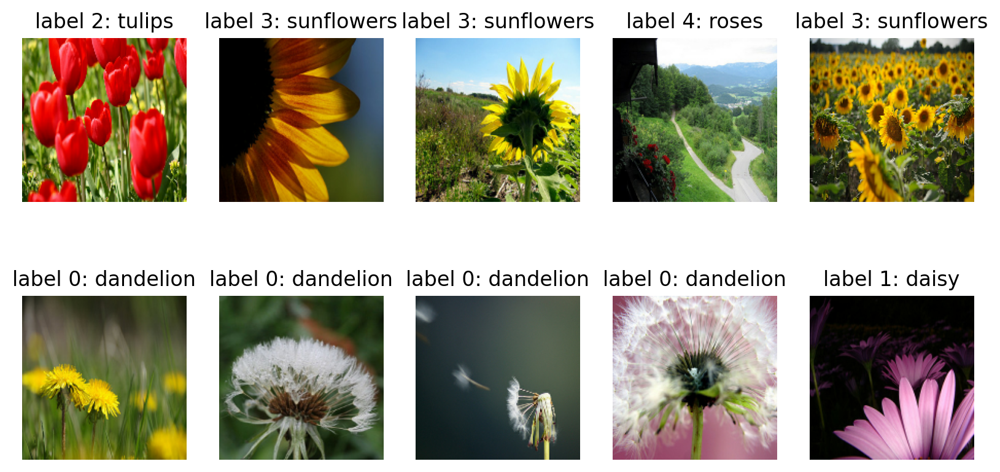

In [115]:
# 한번 더 확인
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx,(image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = image
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')
# 다시 이미지를 시각적으로 확인해 다시 확인해 보니 모든 이미지의 크기가 균일해진 것을 확인할 수 있습니다.

나는 노드에서 진행한 것과 다르게 사이즈를 255.0 으로 맞추고 이후에 리사이징한 크기자체를 불러와서 시각화를 진행했다.

# VGG16 모델 부르기
---

나는 VGG16 모델을 베이스 모델로 해서 프로젝트를 완성하기 원하기 때문에 베이스 모델로 VGG16 모델을 부르겠다.


In [116]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [117]:
#  모델 배치사이즈등을 정해준다.
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
print("힣")

힣


BATCH_SIZE에 따라 32개의 데이터를 랜덤으로 줄 train_batches, validation_batches, test_batches를 만들어 준다. train_batches는 모델이 끊임없이 학습될 수 있도록 전체 데이터에서 32개를 랜덤으로 뽑아 계속 제공

In [118]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)
print("힣")

힣


In [119]:
# train 데이터에서 확인
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

전처리 된 데이터셋을 불러 base_model에 넣는다.

In [120]:
# 그전에 확인
image_batch.shape

TensorShape([32, 160, 160, 3])

In [121]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [122]:
# Base_model 구조 확인
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 160, 160, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 160, 160, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 80, 80, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 80, 80, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 80, 80, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 40, 40, 128)       0     

In [123]:
# 글로벌 어버리지를 통해서 크기만 줄이고 그대로 남기겠다.
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
print("힣")

힣


In [124]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [125]:
# 레이어 구성후 마지막 소프트맥스의 units 값을 5로 만들어준다.

dense_layer = tf.keras.layers.Dense(
    units=512,
    activation='relu'
)
# unit은 우리가 분류하고 싶은 class는 5개였기 때문에 5로 유닛을 준다.
# 활성화 함수는 Softmax를 사용
prediction_layer = tf.keras.layers.Dense(
    units=5,
    activation='softmax'
)

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))
print(prediction_batch.shape)

(32, 5)


In [126]:
# 사전 훈련된 모델 고정하기
base_model.trainable = False
print("힣")

힣


In [127]:
# 최종모델
model = tf.keras.Sequential([
    base_model,
    global_average_layer,
    dense_layer,
    prediction_layer
])
print("힣")

힣


In [128]:
# 구조 확인
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 5, 5, 512)         14714688  
                                                                 
 global_average_pooling2d_3  (None, 512)               0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_6 (Dense)             (None, 512)               262656    
                                                                 
 dense_7 (Dense)             (None, 5)                 2565      
                                                                 
Total params: 14979909 (57.14 MB)
Trainable params: 265221 (1.01 MB)
Non-trainable params: 14714688 (56.13 MB)
_________________________________________________________________


In [129]:
# 컴파일!
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.legacy.RMSprop(learning_rate=base_learning_rate), #tf.keras.optimizers.RMSprop 문제가 mac 환경에는 있기 때문에 전 버전을 활용
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

print("힣")

힣


In [130]:
# 예상 해보기
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

11/20 [===============>..............] - ETA: 0s - loss: 1.8797 - accuracy: 0.1364

20/20 [==============================] - 1s 43ms/step - loss: 1.8824 - accuracy: 0.1335
initial loss: 1.88
initial accuracy: 0.13


Epoch 1/50
92/92 [==============================] - 10s 87ms/step - loss: 1.4403 - accuracy: 0.4513 - val_loss: 1.2863 - val_accuracy: 0.5831
Epoch 2/50
92/92 [==============================] - 9s 94ms/step - loss: 1.1578 - accuracy: 0.6420 - val_loss: 1.0478 - val_accuracy: 0.6567
Epoch 3/50
92/92 [==============================] - 9s 91ms/step - loss: 0.9925 - accuracy: 0.6809 - val_loss: 0.9271 - val_accuracy: 0.7057
Epoch 4/50
92/92 [==============================] - 9s 92ms/step - loss: 0.8871 - accuracy: 0.7159 - val_loss: 0.8612 - val_accuracy: 0.7057
Epoch 5/50
92/92 [==============================] - 8s 84ms/step - loss: 0.8177 - accuracy: 0.7299 - val_loss: 0.7833 - val_accuracy: 0.7193
Epoch 6/50
92/92 [==============================] - 9s 89ms/step - loss: 0.7658 - accuracy: 0.7432 - val_loss: 0.7572 - val_accuracy: 0.7275
Epoch 7/50
92/92 [==============================] - 8s 83ms/step - loss: 0.7269 - accuracy: 0.7572 - val_loss: 0.7218 - val_accuracy: 0.7357
Epoch 8/50
9

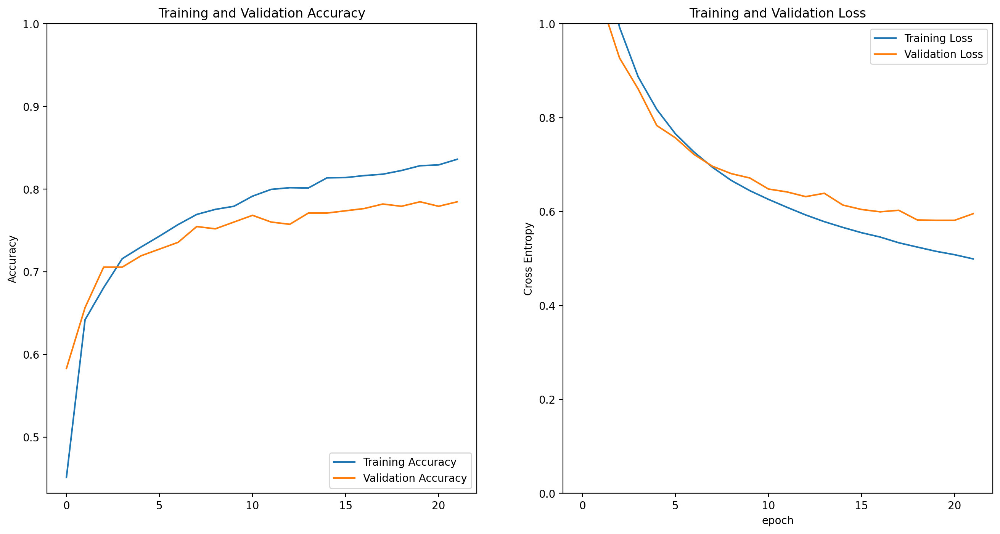

In [131]:
from tensorflow.keras.callbacks import EarlyStopping

EPOCHS = 50 # 베이스 모델이 좋지만 위에서 로스률과 어큐러시때문에 50으로 주겠다.

# 얼리 스톱 & 콜백 설정
early_stopping = EarlyStopping(
    monitor='val_loss',
    min_delta=0.001,
    patience=3,
    verbose=1,
    mode='auto'
)

history = model.fit(
    train_batches,
    epochs=EPOCHS,
    validation_data=validation_batches,
    callbacks=[early_stopping]
)

# 훈련 및 검증 정확도와 손실 값 추출
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

위에서 했던 것과 같이 또 32개의 test sample에 대한 예측 결과를 눈으로도 확인해보고,
샘플을 test_batches에서 가져와 예측 결과 생성

In [132]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

1/1 [==============================] - 0s 167ms/step


array([[4.11129668e-02, 2.23951966e-01, 5.30807257e-01, 7.47629553e-02,
        1.29364833e-01],
       [9.98145223e-01, 1.62595545e-03, 1.31287870e-05, 8.66388436e-05,
        1.29056789e-04],
       [6.10547602e-01, 1.55037001e-01, 4.59373593e-02, 1.59965619e-01,
        2.85124313e-02],
       [1.65986596e-03, 1.12566017e-02, 8.06507945e-01, 6.47046277e-03,
        1.74105167e-01],
       [8.25761735e-01, 1.53153345e-01, 3.43002961e-03, 2.59392406e-03,
        1.50610153e-02],
       [9.63030457e-01, 1.41823655e-02, 3.21905315e-03, 1.66435000e-02,
        2.92470702e-03],
       [6.57859445e-02, 1.27809018e-01, 4.41996008e-01, 1.93607390e-01,
        1.70801625e-01],
       [3.76551598e-01, 4.98663366e-01, 5.69168897e-03, 1.01497516e-01,
        1.75958015e-02],
       [4.33790404e-03, 2.85635958e-03, 3.86857651e-02, 8.11092556e-01,
        1.43027395e-01],
       [9.98542070e-01, 1.37367891e-03, 2.50812536e-06, 7.06710198e-05,
        1.10768942e-05],
       [9.70005751e-01, 2.3646

In [133]:
# 0 과 1 사이로 확률값을 가지고 prediction 값들을 실제 추론한 라벨로 변환
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 0, 2, 1, 3, 0, 0, 3, 4, 4, 0, 3, 2, 0, 2, 4, 2, 0,
       1, 0, 1, 3, 1, 4, 4, 3, 0, 4])

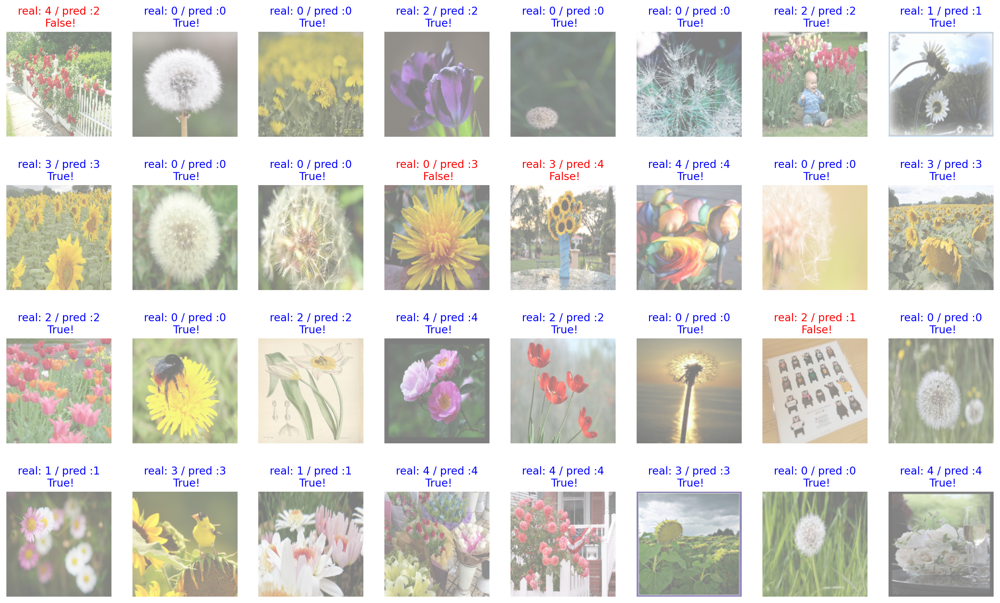

In [134]:
# 시각화
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [135]:
# 정확도 측정
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

87.5


# 이미지 넣어서 돌려보기!!!

In [136]:
import os

data_dir = '/root/.keras/datasets/tf_flowers/tf_flowers/'
checkpoint_dir = os.path.join(os.getenv("HOME"), "tf_flowers/checkpoint")
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

# 체크포인트 디렉토리가 존재하지 않으면 생성
if not os.path.exists(checkpoint_dir):
    os.makedirs(checkpoint_dir)

model.save_weights(checkpoint_file_path)  # 체크포인트 파일 생성

# 체크포인트 파일 생성 확인
if os.path.exists(checkpoint_file_path):
    print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


In [137]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [138]:
# 경로 확인 & 경로안에 확인용 이미지 집어넣기
# !open /root/.keras/datasets/tf_flowers/tf_flowers/ -> 이건 로컬 (나는 이 파일을 로컬에서 처음 작성했다.)

In [139]:
# 이미지 로드해오기
from tensorflow.keras.preprocessing.image import load_img, img_to_array

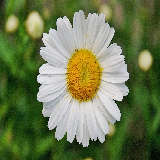

In [140]:
#
IMG_SIZE = 160
img_dir_path = '/content'
daisy_image_path = os.path.join(img_dir_path, 'daisy.jpg')

daisy_image = load_img(daisy_image_path, target_size=(IMG_SIZE, IMG_SIZE))
daisy_image

In [141]:
# 모델에 넣기 쉽도록 배열 자료형으로 변환
daisy_image = img_to_array(daisy_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
daisy_image.shape

(1, 160, 160, 3)

In [142]:
# 예측
prediction = model.predict(daisy_image)
prediction

1/1 [==============================] - 1s 1s/step


array([[0., 1., 0., 0., 0.]], dtype=float32)

In [143]:
# 꽃이미지 예측
def show_and_predict_flower_image(dirpath, filename, class_names, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]

    # 가장 높은 확률을 가진 클래스의 인덱스를 찾고, 해당 꽃의 이름을 가져옵니다.
    predicted_class_index = np.argmax(prediction)
    predicted_class_name = class_names[predicted_class_index]
    confidence = round(prediction[predicted_class_index] * 100, 2)

    print(f"이 이미지는 {confidence}% 확률로 {predicted_class_name} 입니다.")

1/1 [==============================] - 0s 21ms/step
이 이미지는 100.0% 확률로 dandelion 입니다.


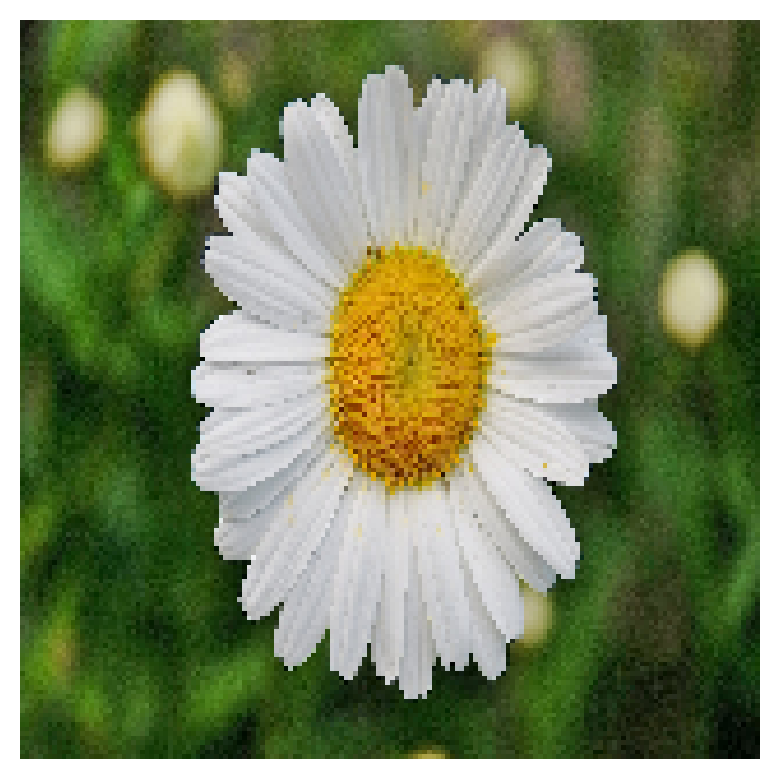

In [144]:
# 꽃의 종류 목록
class_names = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

# 이미지 디렉토리 경로
img_dir_path = '/content'

# daisy 이미지 확인
filename = 'daisy.jpg'

# 예측 함수 호출
show_and_predict_flower_image(img_dir_path, filename, class_names)

1/1 [==============================] - 0s 19ms/step
이 이미지는 100.0% 확률로 sunflowers 입니다.


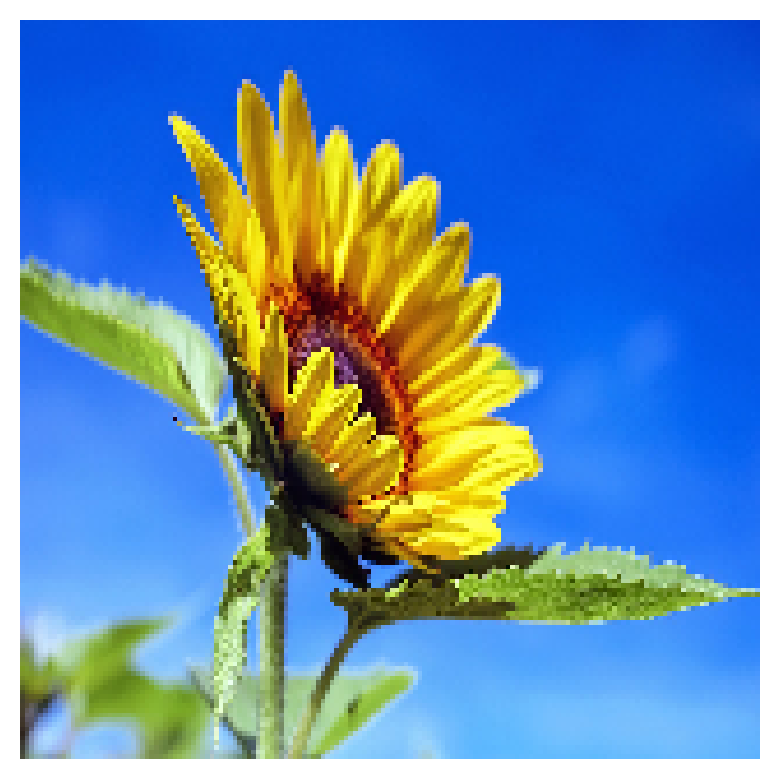

In [145]:
# sunflowers 확인
filename = 'sunflowers.jpg'

# 예측 함수 호출
show_and_predict_flower_image(img_dir_path, filename, class_names)

1/1 [==============================] - 0s 20ms/step
이 이미지는 100.0% 확률로 roses 입니다.


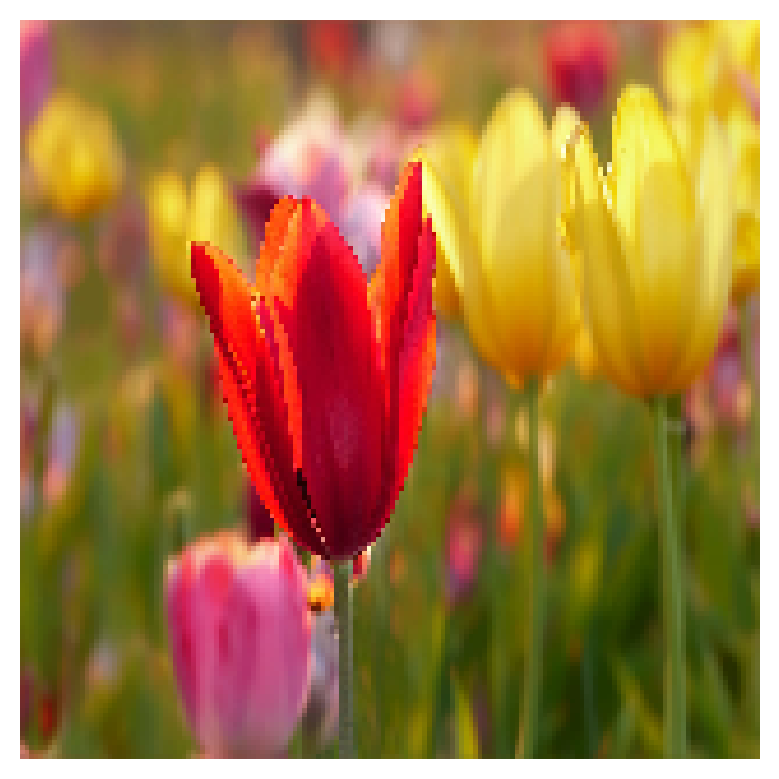

In [146]:
# 튤립
filename = "tulips.jpg"

# 예측 함수 호출
show_and_predict_flower_image(img_dir_path, filename, class_names)

1/1 [==============================] - 0s 19ms/step
이 이미지는 100.0% 확률로 dandelion 입니다.


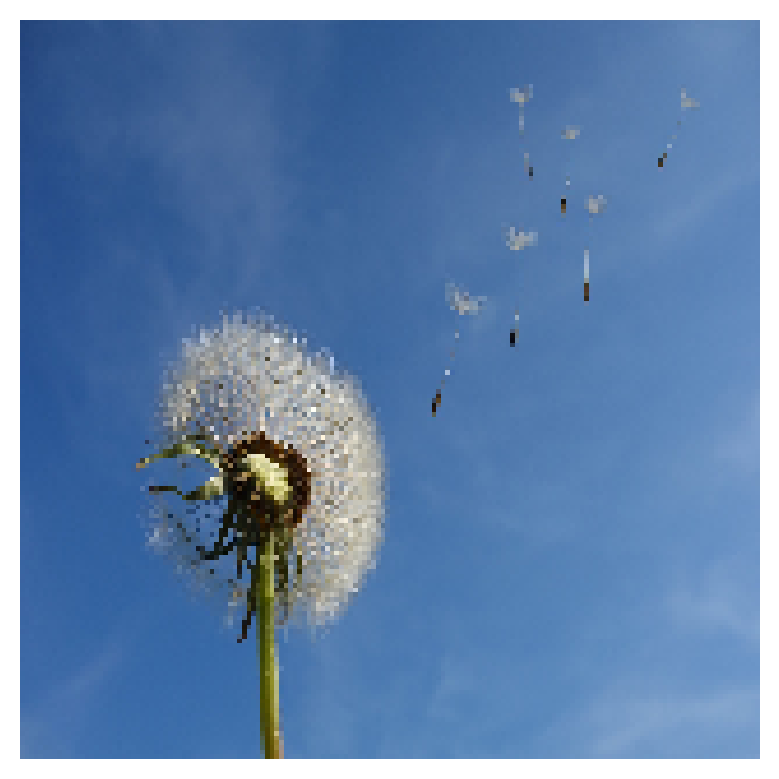

In [147]:
# 단델리온
filename = "dandelion.jpg"

# 예측 함수 호출
show_and_predict_flower_image(img_dir_path, filename, class_names)

1/1 [==============================] - 0s 33ms/step
이 이미지는 100.0% 확률로 tulips 입니다.


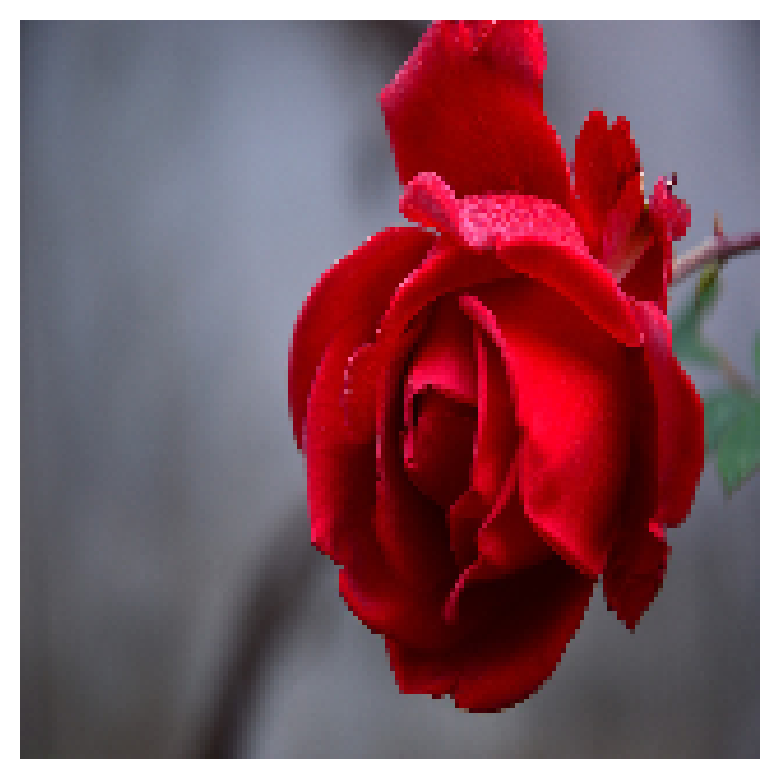

In [148]:
# 장미
filename = "roses.jpg"

# 예측 함수 호출
show_and_predict_flower_image(img_dir_path, filename, class_names)

1/1 [==============================] - 0s 19ms/step
이 이미지는 100.0% 확률로 sunflowers 입니다.


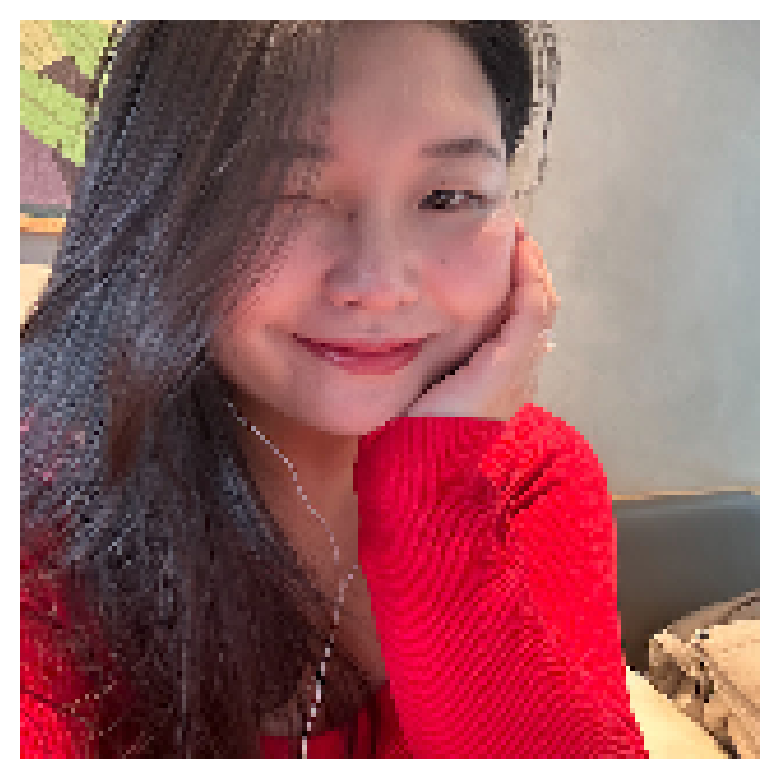

In [149]:
# 나는 무슨 상 꽃이니? ㅋㅋㅋㅋㅋㅋㅋ
filename = "my_face.jpg"

# 예측 함수 호출
show_and_predict_flower_image(img_dir_path, filename, class_names)

# 회고
---

**Keep**: 얼리스탑을 활용해서 모델의 어큐러시를 높였다.

**Problem**: 딱히 큰 문제가 없었고, 시간이 오래걸려서 힘들었다.

**try**: 로컬 경로를 잘찾아서 데이터를 넣고 여러가지 시도를 해볼 수 있어서 재미있었다. 다음에도 이런 여러 시도를 해봐야겠다. 나만의 코드들이 점점 생기는 것 같아서 재미있다. 이 프로젝트를 활용해서 재미있는 다른 모델을 만들어 봐야겠다는 생각을 했다.

---

난 단델리온이다 ㅎㅎㅎ
